<a href="https://colab.research.google.com/github/chipzm/NUIG_Thesis/blob/main/Leopard_Dataset_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q super-gradients

In [ ]:
import glob
import os
import shutil
import json
import random
import numpy as np
import tqdm

from pycocotools.coco import COCO

In [ ]:
!gsutil ls gs://public-datasets-lila/wild-me/

gs://public-datasets-lila/wild-me/
gs://public-datasets-lila/wild-me/beluga-id-test.zip
gs://public-datasets-lila/wild-me/beluga.coco.tar.gz
gs://public-datasets-lila/wild-me/gzgc.coco.tar.gz
gs://public-datasets-lila/wild-me/hyena.coco.tar.gz
gs://public-datasets-lila/wild-me/leopard.coco.tar.gz
gs://public-datasets-lila/wild-me/whaleshark.coco.tar.gz


In [ ]:
!gsutil -m cp -r gs://public-datasets-lila/wild-me/leopard.coco.tar.gz .

Copying gs://public-datasets-lila/wild-me/leopard.coco.tar.gz...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

\
Operation completed over 1 objects/8.0 GiB.                                      


In [ ]:
# Extract tar.gz files
!tar -xzvf "/content/leopard.coco.tar.gz" -C "/content/"

In [ ]:
data_source = COCO(annotation_file='/content/leopard.coco/annotations/instances_train2022.json')

loading annotations into memory...
Done (t=0.22s)
creating index...
index created!


In [ ]:
img_ids = data_source.getImgIds()
catIds = data_source.getCatIds()

categories = data_source.loadCats(catIds)
categories.sort(key=lambda x: x['id'])

classes = {}
coco_labels = {}
coco_labels_inverse = {}

for c in categories:
    coco_labels[len(classes)] = c['id']
    coco_labels_inverse[c['id']] = len(classes)
    classes[c['name']] = len(classes)

class_num = {}

In [ ]:
classes, coco_labels, coco_labels_inverse, class_num

({'leopard': 0}, {0: 0}, {0: 0}, {})

In [ ]:
!mkdir -p dataset/labels dataset/images
save_base_path  = 'dataset/labels/'
save_image_path = 'dataset/images/'

# remapping label id to 0~1
label_transfer = {0: 0}

In [ ]:
for index, img_id in tqdm.tqdm(enumerate(img_ids), desc='change .json file to .txt file'):
    img_info = data_source.loadImgs(img_id)[0]

    # Change the path containing the folder to the file name
    save_name = img_info['file_name'].replace('/', '_')

    # Removing file extensions
    file_name = save_name.split('.')[0]

    # Get the width and height of each image
    height = img_info['height']
    width = img_info['width']

    # Save the converted txt file into tmp folder created
    save_path = save_base_path + file_name + '.txt'
    is_exist = False # To check whether the file already exists

    with open(save_path, mode='w') as fp:
      annotation_id = data_source.getAnnIds(img_id)
      boxes = np.zeros((0, 5))
      if len(annotation_id) == 0: # if there are no annotations for that image or no classes in the image
            fp.write('')
            continue

      annotations = data_source.loadAnns(annotation_id)
      lines = ''

      for annotation in annotations:
        # to get the label of the object
        label = coco_labels_inverse[annotation['category_id']]

        if label in label_transfer.keys():
          is_exist = True
          box = annotation['bbox']
          if box[2] < 1 or box[3] < 1:
            continue
          box[0] = round((box[0] + box[2] / 2) / width, 6)
          box[1] = round((box[1] + box[3] / 2) / height, 6)
          box[2] = round(box[2] / width, 6)
          box[3] = round(box[3] / height, 6)

          if label not in class_num.keys():
            class_num[label] = 0

          class_num[label] += 1
          lines = lines + str(label)

          for i in box:
            lines += ' ' + str(i)
          lines += '\n'

      fp.writelines(lines)

    if is_exist:
        # if there is a target type directory, copy it
      shutil.copy('/content/leopard.coco/images/train2022/{}'.format(img_info['file_name']), os.path.join(save_image_path, save_name))
    else:
      os.remove(save_path)

change .json file to .txt file: 6795it [00:26, 252.31it/s]


In [ ]:
# calculating the total number of files in the src and target dataset folder
img_src = []
ann_src = []

img = r'/content/dataset/images'
ann = r'/content/dataset/labels'

for root, dirs, files in os.walk(img):
  for filename in files:
    # if filename.endswith('.jpg') or filename.endswith('.xml'):
    img_src.append(filename)

for root, dirs, files in os.walk(ann):
  for filename in files:
    # if filename.endswith('.jpg') or filename.endswith('.xml'):
    ann_src.append(filename)

len(img_src), len(ann_src), len(img_src)+len(ann_src)

(6795, 6795, 13590)

In [ ]:
# to remove a directory and its sub directories
directory = ['/content/leopard.coco']

for dir in directory:
  shutil.rmtree(dir)

In [ ]:
!pip install split-folders

In [ ]:
import splitfolders
splitfolders.ratio('dataset', output="leopard_dataset", seed=1337, ratio=(.8, 0.1,0.1))

Copying files: 13590 files [00:26, 509.06 files/s] 


In [ ]:
# to remove a directory and its sub directories
directory = ['/content/dataset']

for dir in directory:
  shutil.rmtree(dir)

In [ ]:
# calculating the total number of files in the train folder
train_img = []
train_ann = []

img = r'/content/leopard_dataset/train/images'
ann = r'/content/leopard_dataset/train/labels'

for root, dirs, files in os.walk(img):
  for filename in files:
    # if filename.endswith('.jpg') or filename.endswith('.xml'):
    train_img.append(filename)

for root, dirs, files in os.walk(ann):
  for filename in files:
    # if filename.endswith('.jpg') or filename.endswith('.xml'):
    train_ann.append(filename)

len(train_img), len(train_ann), len(train_img)+len(train_ann)

(5436, 5436, 10872)

In [ ]:
# calculating the total number of files in the test folder
test_img = []
test_ann = []

img = r'/content/leopard_dataset/test/images'
ann = r'/content/leopard_dataset/test/labels'

for root, dirs, files in os.walk(img):
  for filename in files:
    # if filename.endswith('.jpg') or filename.endswith('.xml'):
    test_img.append(filename)

for root, dirs, files in os.walk(ann):
  for filename in files:
    # if filename.endswith('.jpg') or filename.endswith('.xml'):
    test_ann.append(filename)

len(test_img), len(test_ann), len(test_img)+len(test_ann)

(680, 680, 1360)

In [ ]:
# calculating the total number of files in the val folder
val_img = []
val_ann = []

img = r'/content/leopard_dataset/val/images'
ann = r'/content/leopard_dataset/val/labels'

for root, dirs, files in os.walk(img):
  for filename in files:
    # if filename.endswith('.jpg') or filename.endswith('.xml'):
    val_img.append(filename)

for root, dirs, files in os.walk(ann):
  for filename in files:
    # if filename.endswith('.jpg') or filename.endswith('.xml'):
    val_ann.append(filename)

len(val_img), len(val_ann), len(val_img)+len(val_ann)

(679, 679, 1358)

In [ ]:
from PIL import Image
import os
import numpy as np
import torch

import random
import pathlib
import requests

from torch.utils.data import Dataset
import json
from torchvision import transforms, utils

from pathlib import Path
import cv2
import matplotlib.pyplot as plt

from super_gradients.training import Trainer, dataloaders, models
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

[2023-08-29 03:40:57] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2023-08-29 03:40:59] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-08-29 03:41:10] INFO - utils.py - NumExpr defaulting to 8 threads.
/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2023-08-29 03:41:11] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-08-29 03:41:11] WARNING - export.py - Failed to import pytorch_quantization
[2023-08-29 03:41:11] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization


In [ ]:
class config:
  #trainer params
  exp_name = 'leopard_id'
  chkpt = 'checkpoint'

  #dataset params
  data_dir = '/content/leopard_dataset'

  train_images = 'train/images'
  train_labels = 'train/labels'

  val_images = 'val/images'
  val_labels = 'val/labels'

  test_images = 'test/images'
  test_labels = 'test/labels'

  classes = ['leopard']
  num_classes = len(classes)

  #dataloader params - you can add whatever PyTorch dataloader params you have could be different across train, val, and test
  dataloader_params = {'batch_size':8, 'num_workers':2}

  #model params
  model_name = 'yolo_nas_l'
  pretrained_weights = 'coco'

In [ ]:
# trainer
trainer = Trainer(experiment_name = config.exp_name, ckpt_root_dir = config.chkpt)

In [ ]:
# dataloaders and datasets
train_data = coco_detection_yolo_format_train(dataset_params = {'data_dir': config.data_dir,
                                'images_dir': config.train_images,
                                'labels_dir': config.train_labels,
                                'classes': config.classes},
              dataloader_params = config.dataloader_params)

val_data = coco_detection_yolo_format_val(dataset_params = {'data_dir': config.data_dir,
                                'images_dir': config.val_images,
                                'labels_dir': config.val_labels,
                                'classes': config.classes},
              dataloader_params = config.dataloader_params)

test_data = coco_detection_yolo_format_val(dataset_params = {'data_dir': config.data_dir,
                                'images_dir': config.test_images,
                                'labels_dir': config.test_labels,
                                'classes': config.classes},
              dataloader_params = config.dataloader_params)

[2023-08-23 21:49:10] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 5436/5436 [00:00<00:00, 6782.41it/s]
[2023-08-23 21:49:12] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 679/679 [00:00<00:00, 6130.98it/s]
[2023-08-23 21:49:12] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.


Indexing dataset annotations: 100%|██████████| 680/680 [00:00<00:00, 6724.59it/s]


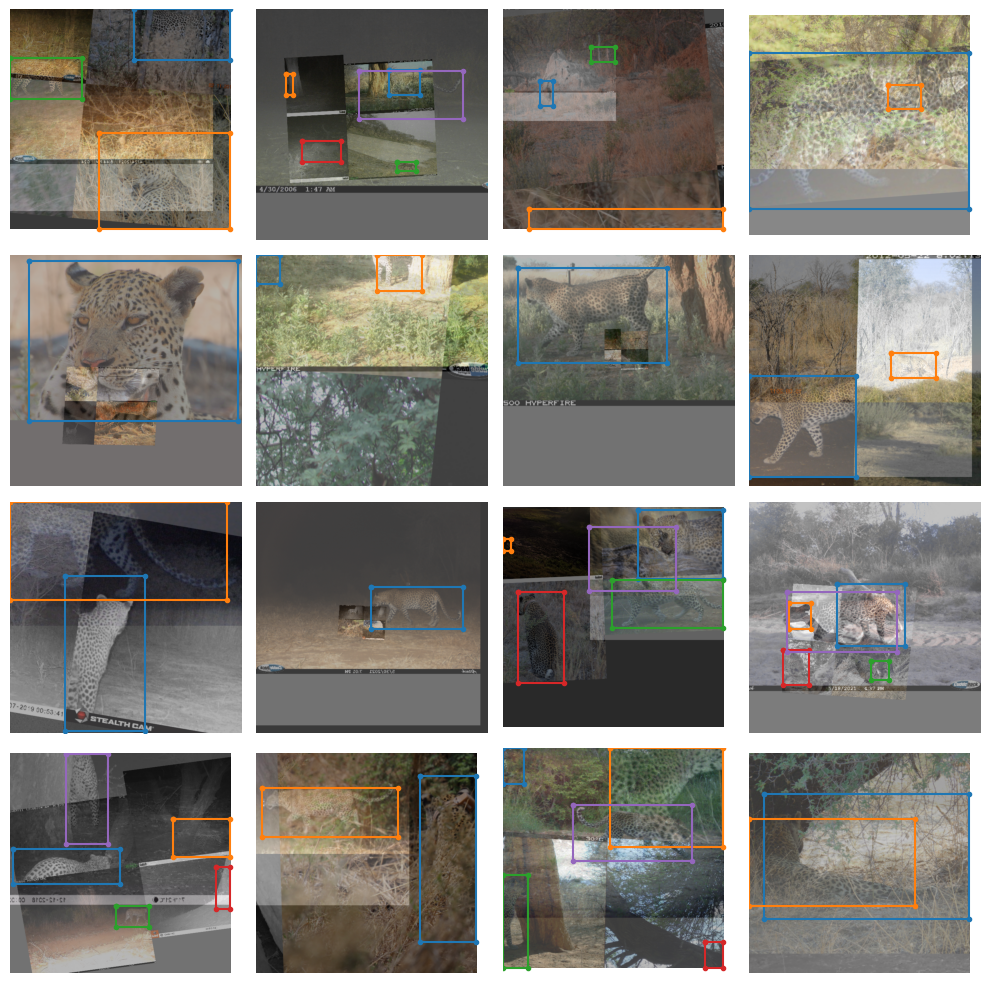

In [ ]:
# plotting the images
train_data.dataset.plot()

In [ ]:
# # Instantiating the model
# model = models.get('yolo_nas_l',
#                    num_classes=1,
#                    pretrained_weights='coco')

[2023-08-28 20:07:23] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:14<00:00, 18.7MB/s]
[2023-08-28 20:07:38] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


In [ ]:
# Instantiating the model
model = models.get(config.model_name,
                   num_classes=config.num_classes,
                   pretrained_weights=config.pretrained_weights)

[2023-08-23 21:49:20] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:02<00:00, 99.1MB/s]
[2023-08-23 21:49:23] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


In [ ]:
# Defining training metrics and parameters
train_params = {# ENABLING SILENT MODE
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-5,
    "lr_warmup_epochs": 5,
    "initial_lr": 3e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 20,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=config.num_classes,
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=config.num_classes,
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

In [ ]:
# Training the model
trainer.train(model = model,
              training_params = train_params,
              train_loader = train_data,
              valid_loader = val_data)

The console stream is now moved to checkpoint/leopard_id/console_Aug23_21_49_32.txt


[2023-08-23 21:49:32] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-08-23 21:49:37] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Dataset size:                 5436       (len(train_set))
    - Batch size per GPU:           8          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             8          (num_gpus * batch_size)
    - Effective Batch size:         8          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         679        (len(train_loader))
    - Gradient updates per epoch:   679        (len(train_loader) / batch_accumulate)

[2023-08-23 21:49:37] INFO - sg_trainer.py - Started training for 20 epochs (0/19)

Validating: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]
[2023-08-23 22:04:29] INFO - base_sg_logger.py 

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1253
│   ├── Ppyoloeloss/loss_iou = 0.2054
│   ├── Ppyoloeloss/loss_dfl = 1.3775
│   └── Ppyoloeloss/loss = 2.3276
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7462
    ├── Ppyoloeloss/loss_iou = 0.1714
    ├── Ppyoloeloss/loss_dfl = 1.2206
    ├── Ppyoloeloss/loss = 1.785
    ├── Precision@0.50 = 0.0814
    ├── Recall@0.50 = 0.9822
    ├── Map@0.50 = 0.9526
    └── F1@0.50 = 0.1504



Validating epoch 1: 100%|██████████| 84/84 [00:31<00:00,  2.70it/s]
[2023-08-23 22:19:11] INFO - base_sg_logger.py - Checkpoint saved in checkpoint/leopard_id/ckpt_best.pth
[2023-08-23 22:19:11] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9674586057662964


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9641
│   │   ├── Epoch N-1      = 1.1253 (↘ -0.1612)
│   │   └── Best until now = 1.1253 (↘ -0.1612)
│   ├── Ppyoloeloss/loss_iou = 0.2035
│   │   ├── Epoch N-1      = 0.2054 (↘ -0.0019)
│   │   └── Best until now = 0.2054 (↘ -0.0019)
│   ├── Ppyoloeloss/loss_dfl = 1.3325
│   │   ├── Epoch N-1      = 1.3775 (↘ -0.045)
│   │   └── Best until now = 1.3775 (↘ -0.045)
│   └── Ppyoloeloss/loss = 2.139
│       ├── Epoch N-1      = 2.3276 (↘ -0.1885)
│       └── Best until now = 2.3276 (↘ -0.1885)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6924
    │   ├── Epoch N-1      = 0.7462 (↘ -0.0538)
    │   └── Best until now = 0.7462 (↘ -0.0538)
    ├── Ppyoloeloss/loss_iou = 0.1709
    │   ├── Epoch N-1      = 0.1714 (↘ -0.0005)
    │   └── Best until now = 0.1714 (↘ -0.0005)
    ├── Ppyoloeloss/loss_dfl = 1.2071
    │   ├── Epoch N-1      = 1.2206 (↘ -0.0135)
    │   └── Best until now = 1.2206 (↘ -0.0135)
    ├── Ppyoloeloss/loss 

Validating epoch 2: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9572
│   │   ├── Epoch N-1      = 0.9641 (↘ -0.007)
│   │   └── Best until now = 0.9641 (↘ -0.007)
│   ├── Ppyoloeloss/loss_iou = 0.2049
│   │   ├── Epoch N-1      = 0.2035 (↗ 0.0014)
│   │   └── Best until now = 0.2035 (↗ 0.0014)
│   ├── Ppyoloeloss/loss_dfl = 1.335
│   │   ├── Epoch N-1      = 1.3325 (↗ 0.0024)
│   │   └── Best until now = 1.3325 (↗ 0.0024)
│   └── Ppyoloeloss/loss = 2.1368
│       ├── Epoch N-1      = 2.139  (↘ -0.0022)
│       └── Best until now = 2.139  (↘ -0.0022)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.861
    │   ├── Epoch N-1      = 0.6924 (↗ 0.1686)
    │   └── Best until now = 0.6924 (↗ 0.1686)
    ├── Ppyoloeloss/loss_iou = 0.1787
    │   ├── Epoch N-1      = 0.1709 (↗ 0.0078)
    │   └── Best until now = 0.1709 (↗ 0.0078)
    ├── Ppyoloeloss/loss_dfl = 1.2584
    │   ├── Epoch N-1      = 1.2071 (↗ 0.0513)
    │   └── Best until now = 1.2071 (↗ 0.0513)
    ├── Ppyoloeloss/loss = 1.9369
  

Validating epoch 3: 100%|██████████| 84/84 [00:31<00:00,  2.68it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.957
│   │   ├── Epoch N-1      = 0.9572 (↘ -0.0002)
│   │   └── Best until now = 0.9572 (↘ -0.0002)
│   ├── Ppyoloeloss/loss_iou = 0.2081
│   │   ├── Epoch N-1      = 0.2049 (↗ 0.0033)
│   │   └── Best until now = 0.2035 (↗ 0.0047)
│   ├── Ppyoloeloss/loss_dfl = 1.3595
│   │   ├── Epoch N-1      = 1.335  (↗ 0.0245)
│   │   └── Best until now = 1.3325 (↗ 0.0269)
│   └── Ppyoloeloss/loss = 2.1571
│       ├── Epoch N-1      = 2.1368 (↗ 0.0203)
│       └── Best until now = 2.1368 (↗ 0.0203)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8423
    │   ├── Epoch N-1      = 0.861  (↘ -0.0187)
    │   └── Best until now = 0.6924 (↗ 0.1499)
    ├── Ppyoloeloss/loss_iou = 0.1773
    │   ├── Epoch N-1      = 0.1787 (↘ -0.0014)
    │   └── Best until now = 0.1709 (↗ 0.0064)
    ├── Ppyoloeloss/loss_dfl = 1.2466
    │   ├── Epoch N-1      = 1.2584 (↘ -0.0119)
    │   └── Best until now = 1.2071 (↗ 0.0394)
    ├── Ppyoloeloss/loss = 1.908

Validating epoch 4: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9672
│   │   ├── Epoch N-1      = 0.957  (↗ 0.0102)
│   │   └── Best until now = 0.957  (↗ 0.0102)
│   ├── Ppyoloeloss/loss_iou = 0.2083
│   │   ├── Epoch N-1      = 0.2081 (↗ 1e-04)
│   │   └── Best until now = 0.2035 (↗ 0.0048)
│   ├── Ppyoloeloss/loss_dfl = 1.3624
│   │   ├── Epoch N-1      = 1.3595 (↗ 0.0029)
│   │   └── Best until now = 1.3325 (↗ 0.0298)
│   └── Ppyoloeloss/loss = 2.169
│       ├── Epoch N-1      = 2.1571 (↗ 0.0119)
│       └── Best until now = 2.1368 (↗ 0.0322)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9364
    │   ├── Epoch N-1      = 0.8423 (↗ 0.0941)
    │   └── Best until now = 0.6924 (↗ 0.244)
    ├── Ppyoloeloss/loss_iou = 0.1939
    │   ├── Epoch N-1      = 0.1773 (↗ 0.0166)
    │   └── Best until now = 0.1709 (↗ 0.0231)
    ├── Ppyoloeloss/loss_dfl = 1.3093
    │   ├── Epoch N-1      = 1.2466 (↗ 0.0627)
    │   └── Best until now = 1.2071 (↗ 0.1021)
    ├── Ppyoloeloss/loss = 2.0759
    │

Validating epoch 5: 100%|██████████| 84/84 [00:31<00:00,  2.70it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.961
│   │   ├── Epoch N-1      = 0.9672 (↘ -0.0062)
│   │   └── Best until now = 0.957  (↗ 0.004)
│   ├── Ppyoloeloss/loss_iou = 0.2101
│   │   ├── Epoch N-1      = 0.2083 (↗ 0.0018)
│   │   └── Best until now = 0.2035 (↗ 0.0066)
│   ├── Ppyoloeloss/loss_dfl = 1.3599
│   │   ├── Epoch N-1      = 1.3624 (↘ -0.0025)
│   │   └── Best until now = 1.3325 (↗ 0.0273)
│   └── Ppyoloeloss/loss = 2.1661
│       ├── Epoch N-1      = 2.169  (↘ -0.003)
│       └── Best until now = 2.1368 (↗ 0.0293)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8665
    │   ├── Epoch N-1      = 0.9364 (↘ -0.07)
    │   └── Best until now = 0.6924 (↗ 0.174)
    ├── Ppyoloeloss/loss_iou = 0.1781
    │   ├── Epoch N-1      = 0.1939 (↘ -0.0158)
    │   └── Best until now = 0.1709 (↗ 0.0073)
    ├── Ppyoloeloss/loss_dfl = 1.2296
    │   ├── Epoch N-1      = 1.3093 (↘ -0.0797)
    │   └── Best until now = 1.2071 (↗ 0.0225)
    ├── Ppyoloeloss/loss = 1.9266
  

Validating epoch 6: 100%|██████████| 84/84 [00:31<00:00,  2.70it/s]


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9488
│   │   ├── Epoch N-1      = 0.961  (↘ -0.0122)
│   │   └── Best until now = 0.957  (↘ -0.0082)
│   ├── Ppyoloeloss/loss_iou = 0.2057
│   │   ├── Epoch N-1      = 0.2101 (↘ -0.0043)
│   │   └── Best until now = 0.2035 (↗ 0.0023)
│   ├── Ppyoloeloss/loss_dfl = 1.3398
│   │   ├── Epoch N-1      = 1.3599 (↘ -0.0201)
│   │   └── Best until now = 1.3325 (↗ 0.0073)
│   └── Ppyoloeloss/loss = 2.133
│       ├── Epoch N-1      = 2.1661 (↘ -0.0331)
│       └── Best until now = 2.1368 (↘ -0.0038)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8212
    │   ├── Epoch N-1      = 0.8665 (↘ -0.0453)
    │   └── Best until now = 0.6924 (↗ 0.1287)
    ├── Ppyoloeloss/loss_iou = 0.178
    │   ├── Epoch N-1      = 0.1781 (↘ -1e-04)
    │   └── Best until now = 0.1709 (↗ 0.0072)
    ├── Ppyoloeloss/loss_dfl = 1.2392
    │   ├── Epoch N-1      = 1.2296 (↗ 0.0096)
    │   └── Best until now = 1.2071 (↗ 0.0321)
    ├── Ppyoloeloss/loss = 1.88

Validating epoch 7: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9391
│   │   ├── Epoch N-1      = 0.9488 (↘ -0.0097)
│   │   └── Best until now = 0.9488 (↘ -0.0097)
│   ├── Ppyoloeloss/loss_iou = 0.202
│   │   ├── Epoch N-1      = 0.2057 (↘ -0.0037)
│   │   └── Best until now = 0.2035 (↘ -0.0014)
│   ├── Ppyoloeloss/loss_dfl = 1.3281
│   │   ├── Epoch N-1      = 1.3398 (↘ -0.0117)
│   │   └── Best until now = 1.3325 (↘ -0.0045)
│   └── Ppyoloeloss/loss = 2.1082
│       ├── Epoch N-1      = 2.133  (↘ -0.0248)
│       └── Best until now = 2.133  (↘ -0.0248)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7704
    │   ├── Epoch N-1      = 0.8212 (↘ -0.0508)
    │   └── Best until now = 0.6924 (↗ 0.078)
    ├── Ppyoloeloss/loss_iou = 0.1742
    │   ├── Epoch N-1      = 0.178  (↘ -0.0038)
    │   └── Best until now = 0.1709 (↗ 0.0034)
    ├── Ppyoloeloss/loss_dfl = 1.2076
    │   ├── Epoch N-1      = 1.2392 (↘ -0.0316)
    │   └── Best until now = 1.2071 (↗ 0.0005)
    ├── Ppyoloeloss/loss = 

Validating epoch 8: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9157
│   │   ├── Epoch N-1      = 0.9391 (↘ -0.0233)
│   │   └── Best until now = 0.9391 (↘ -0.0233)
│   ├── Ppyoloeloss/loss_iou = 0.2008
│   │   ├── Epoch N-1      = 0.202  (↘ -0.0013)
│   │   └── Best until now = 0.202  (↘ -0.0013)
│   ├── Ppyoloeloss/loss_dfl = 1.3132
│   │   ├── Epoch N-1      = 1.3281 (↘ -0.0149)
│   │   └── Best until now = 1.3281 (↘ -0.0149)
│   └── Ppyoloeloss/loss = 2.0742
│       ├── Epoch N-1      = 2.1082 (↘ -0.0339)
│       └── Best until now = 2.1082 (↘ -0.0339)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7727
    │   ├── Epoch N-1      = 0.7704 (↗ 0.0023)
    │   └── Best until now = 0.6924 (↗ 0.0803)
    ├── Ppyoloeloss/loss_iou = 0.1709
    │   ├── Epoch N-1      = 0.1742 (↘ -0.0033)
    │   └── Best until now = 0.1709 (↗ 0.0)
    ├── Ppyoloeloss/loss_dfl = 1.2087
    │   ├── Epoch N-1      = 1.2076 (↗ 0.0011)
    │   └── Best until now = 1.2071 (↗ 0.0015)
    ├── Ppyoloeloss/loss = 1.8

Validating epoch 9: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9132
│   │   ├── Epoch N-1      = 0.9157 (↘ -0.0025)
│   │   └── Best until now = 0.9157 (↘ -0.0025)
│   ├── Ppyoloeloss/loss_iou = 0.1971
│   │   ├── Epoch N-1      = 0.2008 (↘ -0.0036)
│   │   └── Best until now = 0.2008 (↘ -0.0036)
│   ├── Ppyoloeloss/loss_dfl = 1.3043
│   │   ├── Epoch N-1      = 1.3132 (↘ -0.0089)
│   │   └── Best until now = 1.3132 (↘ -0.0089)
│   └── Ppyoloeloss/loss = 2.0583
│       ├── Epoch N-1      = 2.0742 (↘ -0.016)
│       └── Best until now = 2.0742 (↘ -0.016)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7568
    │   ├── Epoch N-1      = 0.7727 (↘ -0.016)
    │   └── Best until now = 0.6924 (↗ 0.0643)
    ├── Ppyoloeloss/loss_iou = 0.1753
    │   ├── Epoch N-1      = 0.1709 (↗ 0.0044)
    │   └── Best until now = 0.1709 (↗ 0.0044)
    ├── Ppyoloeloss/loss_dfl = 1.2
    │   ├── Epoch N-1      = 1.2087 (↘ -0.0087)
    │   └── Best until now = 1.2071 (↘ -0.0071)
    ├── Ppyoloeloss/loss = 1.79

Validating epoch 10: 100%|██████████| 84/84 [00:31<00:00,  2.68it/s]


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8937
│   │   ├── Epoch N-1      = 0.9132 (↘ -0.0196)
│   │   └── Best until now = 0.9132 (↘ -0.0196)
│   ├── Ppyoloeloss/loss_iou = 0.194
│   │   ├── Epoch N-1      = 0.1971 (↘ -0.0031)
│   │   └── Best until now = 0.1971 (↘ -0.0031)
│   ├── Ppyoloeloss/loss_dfl = 1.2843
│   │   ├── Epoch N-1      = 1.3043 (↘ -0.02)
│   │   └── Best until now = 1.3043 (↘ -0.02)
│   └── Ppyoloeloss/loss = 2.0208
│       ├── Epoch N-1      = 2.0583 (↘ -0.0374)
│       └── Best until now = 2.0583 (↘ -0.0374)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7421
    │   ├── Epoch N-1      = 0.7568 (↘ -0.0147)
    │   └── Best until now = 0.6924 (↗ 0.0497)
    ├── Ppyoloeloss/loss_iou = 0.1752
    │   ├── Epoch N-1      = 0.1753 (↘ -1e-04)
    │   └── Best until now = 0.1709 (↗ 0.0043)
    ├── Ppyoloeloss/loss_dfl = 1.2264
    │   ├── Epoch N-1      = 1.2    (↗ 0.0264)
    │   └── Best until now = 1.2    (↗ 0.0264)
    ├── Ppyoloeloss/loss = 1.79

Validating epoch 11: 100%|██████████| 84/84 [00:31<00:00,  2.70it/s]


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8826
│   │   ├── Epoch N-1      = 0.8937 (↘ -0.0111)
│   │   └── Best until now = 0.8937 (↘ -0.0111)
│   ├── Ppyoloeloss/loss_iou = 0.1921
│   │   ├── Epoch N-1      = 0.194  (↘ -0.0019)
│   │   └── Best until now = 0.194  (↘ -0.0019)
│   ├── Ppyoloeloss/loss_dfl = 1.2731
│   │   ├── Epoch N-1      = 1.2843 (↘ -0.0112)
│   │   └── Best until now = 1.2843 (↘ -0.0112)
│   └── Ppyoloeloss/loss = 1.9994
│       ├── Epoch N-1      = 2.0208 (↘ -0.0214)
│       └── Best until now = 2.0208 (↘ -0.0214)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7277
    │   ├── Epoch N-1      = 0.7421 (↘ -0.0144)
    │   └── Best until now = 0.6924 (↗ 0.0352)
    ├── Ppyoloeloss/loss_iou = 0.1641
    │   ├── Epoch N-1      = 0.1752 (↘ -0.0111)
    │   └── Best until now = 0.1709 (↘ -0.0068)
    ├── Ppyoloeloss/loss_dfl = 1.1716
    │   ├── Epoch N-1      = 1.2264 (↘ -0.0548)
    │   └── Best until now = 1.2    (↘ -0.0284)
    ├── Ppyoloeloss/lo

Validating epoch 12: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8653
│   │   ├── Epoch N-1      = 0.8826 (↘ -0.0173)
│   │   └── Best until now = 0.8826 (↘ -0.0173)
│   ├── Ppyoloeloss/loss_iou = 0.189
│   │   ├── Epoch N-1      = 0.1921 (↘ -0.0031)
│   │   └── Best until now = 0.1921 (↘ -0.0031)
│   ├── Ppyoloeloss/loss_dfl = 1.2508
│   │   ├── Epoch N-1      = 1.2731 (↘ -0.0223)
│   │   └── Best until now = 1.2731 (↘ -0.0223)
│   └── Ppyoloeloss/loss = 1.9631
│       ├── Epoch N-1      = 1.9994 (↘ -0.0363)
│       └── Best until now = 1.9994 (↘ -0.0363)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8205
    │   ├── Epoch N-1      = 0.7277 (↗ 0.0928)
    │   └── Best until now = 0.6924 (↗ 0.128)
    ├── Ppyoloeloss/loss_iou = 0.1669
    │   ├── Epoch N-1      = 0.1641 (↗ 0.0028)
    │   └── Best until now = 0.1641 (↗ 0.0028)
    ├── Ppyoloeloss/loss_dfl = 1.195
    │   ├── Epoch N-1      = 1.1716 (↗ 0.0235)
    │   └── Best until now = 1.1716 (↗ 0.0235)
    ├── Ppyoloeloss/loss = 1.8

Validating epoch 13: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]
[2023-08-24 01:16:32] INFO - base_sg_logger.py - Checkpoint saved in checkpoint/leopard_id/ckpt_best.pth
[2023-08-24 01:16:32] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9678707122802734


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8475
│   │   ├── Epoch N-1      = 0.8653 (↘ -0.0177)
│   │   └── Best until now = 0.8653 (↘ -0.0177)
│   ├── Ppyoloeloss/loss_iou = 0.1849
│   │   ├── Epoch N-1      = 0.189  (↘ -0.004)
│   │   └── Best until now = 0.189  (↘ -0.004)
│   ├── Ppyoloeloss/loss_dfl = 1.2349
│   │   ├── Epoch N-1      = 1.2508 (↘ -0.016)
│   │   └── Best until now = 1.2508 (↘ -0.016)
│   └── Ppyoloeloss/loss = 1.9273
│       ├── Epoch N-1      = 1.9631 (↘ -0.0358)
│       └── Best until now = 1.9631 (↘ -0.0358)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6855
    │   ├── Epoch N-1      = 0.8205 (↘ -0.135)
    │   └── Best until now = 0.6924 (↘ -0.0069)
    ├── Ppyoloeloss/loss_iou = 0.1654
    │   ├── Epoch N-1      = 0.1669 (↘ -0.0015)
    │   └── Best until now = 0.1641 (↗ 0.0013)
    ├── Ppyoloeloss/loss_dfl = 1.1574
    │   ├── Epoch N-1      = 1.195  (↘ -0.0376)
    │   └── Best until now = 1.1716 (↘ -0.0142)
    ├── Ppyoloeloss/loss = 

Validating epoch 14: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]
[2023-08-24 01:31:14] INFO - base_sg_logger.py - Checkpoint saved in checkpoint/leopard_id/ckpt_best.pth
[2023-08-24 01:31:14] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.974024772644043


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8289
│   │   ├── Epoch N-1      = 0.8475 (↘ -0.0186)
│   │   └── Best until now = 0.8475 (↘ -0.0186)
│   ├── Ppyoloeloss/loss_iou = 0.1816
│   │   ├── Epoch N-1      = 0.1849 (↘ -0.0034)
│   │   └── Best until now = 0.1849 (↘ -0.0034)
│   ├── Ppyoloeloss/loss_dfl = 1.2138
│   │   ├── Epoch N-1      = 1.2349 (↘ -0.0211)
│   │   └── Best until now = 1.2349 (↘ -0.0211)
│   └── Ppyoloeloss/loss = 1.8897
│       ├── Epoch N-1      = 1.9273 (↘ -0.0376)
│       └── Best until now = 1.9273 (↘ -0.0376)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6921
    │   ├── Epoch N-1      = 0.6855 (↗ 0.0066)
    │   └── Best until now = 0.6855 (↗ 0.0066)
    ├── Ppyoloeloss/loss_iou = 0.1631
    │   ├── Epoch N-1      = 0.1654 (↘ -0.0023)
    │   └── Best until now = 0.1641 (↘ -0.001)
    ├── Ppyoloeloss/loss_dfl = 1.1383
    │   ├── Epoch N-1      = 1.1574 (↘ -0.0191)
    │   └── Best until now = 1.1574 (↘ -0.0191)
    ├── Ppyoloeloss/loss

Validating epoch 15: 100%|██████████| 84/84 [00:31<00:00,  2.69it/s]
[2023-08-24 01:46:01] INFO - base_sg_logger.py - Checkpoint saved in checkpoint/leopard_id/ckpt_best.pth
[2023-08-24 01:46:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9784051179885864


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8187
│   │   ├── Epoch N-1      = 0.8289 (↘ -0.0103)
│   │   └── Best until now = 0.8289 (↘ -0.0103)
│   ├── Ppyoloeloss/loss_iou = 0.1785
│   │   ├── Epoch N-1      = 0.1816 (↘ -0.003)
│   │   └── Best until now = 0.1816 (↘ -0.003)
│   ├── Ppyoloeloss/loss_dfl = 1.2017
│   │   ├── Epoch N-1      = 1.2138 (↘ -0.0121)
│   │   └── Best until now = 1.2138 (↘ -0.0121)
│   └── Ppyoloeloss/loss = 1.8658
│       ├── Epoch N-1      = 1.8897 (↘ -0.0239)
│       └── Best until now = 1.8897 (↘ -0.0239)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6537
    │   ├── Epoch N-1      = 0.6921 (↘ -0.0383)
    │   └── Best until now = 0.6855 (↘ -0.0318)
    ├── Ppyoloeloss/loss_iou = 0.1557
    │   ├── Epoch N-1      = 0.1631 (↘ -0.0074)
    │   └── Best until now = 0.1631 (↘ -0.0074)
    ├── Ppyoloeloss/loss_dfl = 1.1058
    │   ├── Epoch N-1      = 1.1383 (↘ -0.0324)
    │   └── Best until now = 1.1383 (↘ -0.0324)
    ├── Ppyoloeloss/los

Validating epoch 16: 100%|██████████| 84/84 [00:31<00:00,  2.70it/s]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.808
│   │   ├── Epoch N-1      = 0.8187 (↘ -0.0106)
│   │   └── Best until now = 0.8187 (↘ -0.0106)
│   ├── Ppyoloeloss/loss_iou = 0.1771
│   │   ├── Epoch N-1      = 0.1785 (↘ -0.0014)
│   │   └── Best until now = 0.1785 (↘ -0.0014)
│   ├── Ppyoloeloss/loss_dfl = 1.1821
│   │   ├── Epoch N-1      = 1.2017 (↘ -0.0196)
│   │   └── Best until now = 1.2017 (↘ -0.0196)
│   └── Ppyoloeloss/loss = 1.8419
│       ├── Epoch N-1      = 1.8658 (↘ -0.0239)
│       └── Best until now = 1.8658 (↘ -0.0239)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6473
    │   ├── Epoch N-1      = 0.6537 (↘ -0.0065)
    │   └── Best until now = 0.6537 (↘ -0.0065)
    ├── Ppyoloeloss/loss_iou = 0.1545
    │   ├── Epoch N-1      = 0.1557 (↘ -0.0012)
    │   └── Best until now = 0.1557 (↘ -0.0012)
    ├── Ppyoloeloss/loss_dfl = 1.1143
    │   ├── Epoch N-1      = 1.1058 (↗ 0.0085)
    │   └── Best until now = 1.1058 (↗ 0.0085)
    ├── Ppyoloeloss/loss

Validating epoch 17: 100%|██████████| 84/84 [00:30<00:00,  2.79it/s]


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7886
│   │   ├── Epoch N-1      = 0.808  (↘ -0.0194)
│   │   └── Best until now = 0.808  (↘ -0.0194)
│   ├── Ppyoloeloss/loss_iou = 0.1735
│   │   ├── Epoch N-1      = 0.1771 (↘ -0.0036)
│   │   └── Best until now = 0.1771 (↘ -0.0036)
│   ├── Ppyoloeloss/loss_dfl = 1.1752
│   │   ├── Epoch N-1      = 1.1821 (↘ -0.0069)
│   │   └── Best until now = 1.1821 (↘ -0.0069)
│   └── Ppyoloeloss/loss = 1.8101
│       ├── Epoch N-1      = 1.8419 (↘ -0.0318)
│       └── Best until now = 1.8419 (↘ -0.0318)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6566
    │   ├── Epoch N-1      = 0.6473 (↗ 0.0094)
    │   └── Best until now = 0.6473 (↗ 0.0094)
    ├── Ppyoloeloss/loss_iou = 0.16
    │   ├── Epoch N-1      = 0.1545 (↗ 0.0055)
    │   └── Best until now = 0.1545 (↗ 0.0055)
    ├── Ppyoloeloss/loss_dfl = 1.1233
    │   ├── Epoch N-1      = 1.1143 (↗ 0.0089)
    │   └── Best until now = 1.1058 (↗ 0.0175)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 18: 100%|██████████| 84/84 [00:29<00:00,  2.81it/s]
[2023-08-24 02:30:38] INFO - base_sg_logger.py - Checkpoint saved in checkpoint/leopard_id/ckpt_best.pth
[2023-08-24 02:30:38] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9788087010383606


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7787
│   │   ├── Epoch N-1      = 0.7886 (↘ -0.0099)
│   │   └── Best until now = 0.7886 (↘ -0.0099)
│   ├── Ppyoloeloss/loss_iou = 0.1712
│   │   ├── Epoch N-1      = 0.1735 (↘ -0.0024)
│   │   └── Best until now = 0.1735 (↘ -0.0024)
│   ├── Ppyoloeloss/loss_dfl = 1.1586
│   │   ├── Epoch N-1      = 1.1752 (↘ -0.0166)
│   │   └── Best until now = 1.1752 (↘ -0.0166)
│   └── Ppyoloeloss/loss = 1.7859
│       ├── Epoch N-1      = 1.8101 (↘ -0.0242)
│       └── Best until now = 1.8101 (↘ -0.0242)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6284
    │   ├── Epoch N-1      = 0.6566 (↘ -0.0283)
    │   └── Best until now = 0.6473 (↘ -0.0189)
    ├── Ppyoloeloss/loss_iou = 0.1561
    │   ├── Epoch N-1      = 0.16   (↘ -0.0039)
    │   └── Best until now = 0.1545 (↗ 0.0016)
    ├── Ppyoloeloss/loss_dfl = 1.1125
    │   ├── Epoch N-1      = 1.1233 (↘ -0.0107)
    │   └── Best until now = 1.1058 (↗ 0.0067)
    ├── Ppyoloeloss/los

Validating epoch 19: 100%|██████████| 84/84 [00:29<00:00,  2.81it/s]
[2023-08-24 02:45:38] INFO - base_sg_logger.py - Checkpoint saved in checkpoint/leopard_id/ckpt_best.pth
[2023-08-24 02:45:38] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9808385968208313


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7708
│   │   ├── Epoch N-1      = 0.7787 (↘ -0.0079)
│   │   └── Best until now = 0.7787 (↘ -0.0079)
│   ├── Ppyoloeloss/loss_iou = 0.1693
│   │   ├── Epoch N-1      = 0.1712 (↘ -0.0019)
│   │   └── Best until now = 0.1712 (↘ -0.0019)
│   ├── Ppyoloeloss/loss_dfl = 1.1502
│   │   ├── Epoch N-1      = 1.1586 (↘ -0.0084)
│   │   └── Best until now = 1.1586 (↘ -0.0084)
│   └── Ppyoloeloss/loss = 1.769
│       ├── Epoch N-1      = 1.7859 (↘ -0.0169)
│       └── Best until now = 1.7859 (↘ -0.0169)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6062
    │   ├── Epoch N-1      = 0.6284 (↘ -0.0221)
    │   └── Best until now = 0.6284 (↘ -0.0221)
    ├── Ppyoloeloss/loss_iou = 0.1527
    │   ├── Epoch N-1      = 0.1561 (↘ -0.0035)
    │   └── Best until now = 0.1545 (↘ -0.0018)
    ├── Ppyoloeloss/loss_dfl = 1.0906
    │   ├── Epoch N-1      = 1.1125 (↘ -0.0219)
    │   └── Best until now = 1.1058 (↘ -0.0152)
    ├── Ppyoloeloss/lo

[2023-08-24 02:45:53] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 20: 100%|██████████| 84/84 [00:29<00:00,  2.81it/s]


In [ ]:
# Analyze training metrics
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/leopard_chekpt/leopard_id

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2811), started 2:49:45 ago. (Use '!kill 2811' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Zip and download fine-tuned model
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
%cp -av "/content/checkpoint" "/content/drive/MyDrive"

'/content/checkpoint' -> '/content/drive/MyDrive/checkpoint'
'/content/checkpoint/leopard_id' -> '/content/drive/MyDrive/checkpoint/leopard_id'
'/content/checkpoint/leopard_id/events.out.tfevents.1692827372.241d0e57ac27.2142.0' -> '/content/drive/MyDrive/checkpoint/leopard_id/events.out.tfevents.1692827372.241d0e57ac27.2142.0'
'/content/checkpoint/leopard_id/logs_Aug23_21_49_32.txt' -> '/content/drive/MyDrive/checkpoint/leopard_id/logs_Aug23_21_49_32.txt'
'/content/checkpoint/leopard_id/console_Aug23_21_49_32.txt' -> '/content/drive/MyDrive/checkpoint/leopard_id/console_Aug23_21_49_32.txt'
'/content/checkpoint/leopard_id/experiment_logs_Aug23_21_49_32.txt' -> '/content/drive/MyDrive/checkpoint/leopard_id/experiment_logs_Aug23_21_49_32.txt'
'/content/checkpoint/leopard_id/events.out.tfevents.1692845184.241d0e57ac27.2142.1' -> '/content/drive/MyDrive/checkpoint/leopard_id/events.out.tfevents.1692845184.241d0e57ac27.2142.1'
'/content/checkpoint/leopard_id/ckpt_latest.pth' -> '/content/dri

In [ ]:
# !zip -r chekpt_leopard.zip {config.chkpt}/{config.exp_name}
!zip -r /content/leopard_chekpt.zip /content/checkpoint

from google.colab import files
files.download("/content/leopard_chekpt.zip")

  adding: content/checkpoint/ (stored 0%)
  adding: content/checkpoint/leopard_id/ (stored 0%)
  adding: content/checkpoint/leopard_id/events.out.tfevents.1692845184.241d0e57ac27.2142.1 (deflated 43%)
  adding: content/checkpoint/leopard_id/experiment_logs_Aug23_21_49_32.txt (deflated 73%)
  adding: content/checkpoint/leopard_id/ckpt_latest.pth (deflated 7%)
  adding: content/checkpoint/leopard_id/console_Aug23_21_49_32.txt (deflated 96%)
  adding: content/checkpoint/leopard_id/events.out.tfevents.1692827372.241d0e57ac27.2142.0 (deflated 79%)
  adding: content/checkpoint/leopard_id/ckpt_best.pth (deflated 7%)
  adding: content/checkpoint/leopard_id/logs_Aug23_21_49_32.txt (deflated 89%)
  adding: content/checkpoint/leopard_id/average_model.pth

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# the best model
best_model = models.get('yolo_nas_l',
                        num_classes = 17,
                        checkpoint_path = '/content/drive/MyDrive/kaggle_edited_chkpt/kaggle_edited/average_model.pth')

[2023-08-29 03:42:44] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/kaggle_edited_chkpt/kaggle_edited/average_model.pth EMA checkpoint.


In [ ]:
# the best model
best_model = models.get(config.model_name,
                        num_classes = config.num_classes,
                        checkpoint_path = os.path.join(config.chkpt, config.exp_name, 'average_model.pth'))

 (deflated 7%)


In [ ]:
# Evaluating the best model on testing dataset
trainer.test(model = best_model,
             test_loader = test_data,
             test_metrics_list = DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=config.num_classes,
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                          nms_top_k=1000,
                                                                                                          max_predictions=300,
                                                                                                          nms_threshold=0.7)
                                                   )
             )

[2023-08-24 03:38:00] INFO - checkpoint_utils.py - Successfully loaded model weights from checkpoint/leopard_id/average_model.pth EMA checkpoint.
Testing:  99%|█████████▉| 84/85 [00:31<00:00,  2.78it/s]

{'PPYoloELoss/loss_cls': 0.59846586,
 'PPYoloELoss/loss_iou': 0.15044363,
 'PPYoloELoss/loss_dfl': 1.0756063,
 'PPYoloELoss/loss': 1.5123783,
 'Precision@0.50': 0.10976593941450119,
 'Recall@0.50': 0.9956076145172119,
 'mAP@0.50': 0.9784447550773621,
 'F1@0.50': 0.19773191213607788}

In [ ]:
!pip install supervision

In [ ]:
# Inference with trained model
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path = '/content/leopard_dataset/test/images',
    annotations_directory_path = '/content/leopard_dataset/test/labels',
    # data_yaml_path=f"{dataset.location}/data.yaml",
    force_masks = False
)

In [ ]:
CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = list(best_model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
    detections = sv.Detections(xyxy = result.prediction.bboxes_xyxy,
                               confidence=result.prediction.confidence,
                               class_id=result.prediction.labels.astype(int)
                               )
    predictions[image_name] = detections

In [ ]:
# Visualize inference results
random.seed(10)

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

In [ ]:
# Calculate confusion matrix
!pip install onemetric

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

[2023-08-28 21:37:53] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


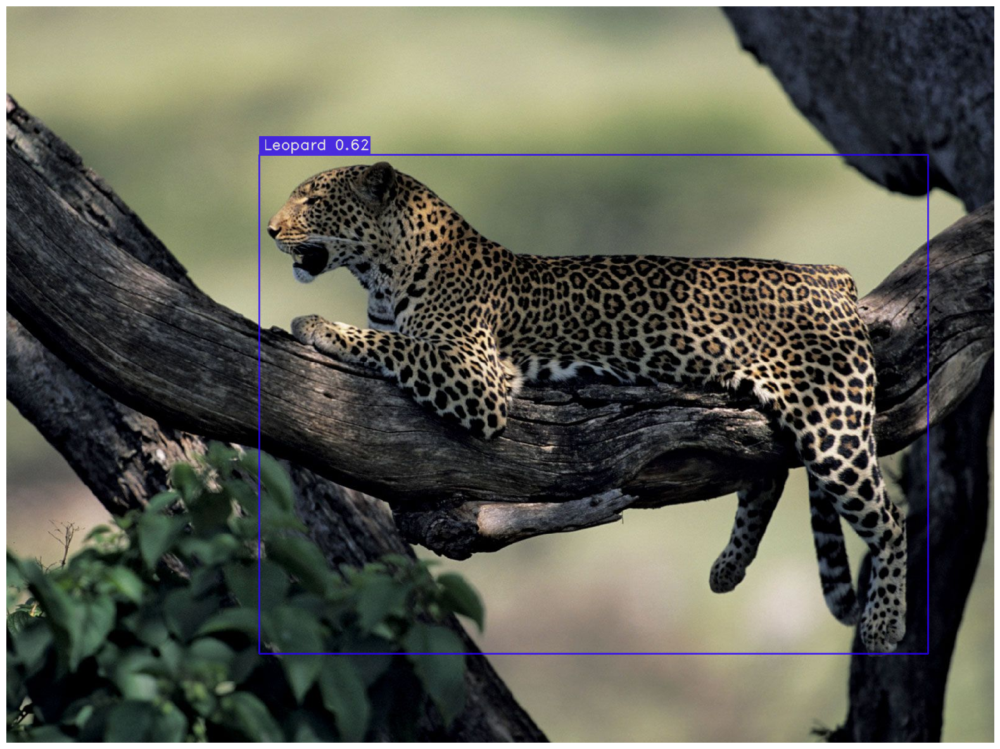

In [ ]:
# Predicting new data with 20 epochs
url = 'https://cdn.britannica.com/40/146340-050-297B2798/Leopard-tree-Kenya-Masai-Mara-National-Reserve.jpg'
# url = 'https://i.pinimg.com/1200x/da/8f/72/da8f729a05ad064830f30cc757d2d277.jpg'
# fig = '/content/n02085620_326.jpg'
best_model.predict(url).show()

In [ ]:
# # Saving the predicted image and gathering the details required
# from collections import Counter

# pred = best_model.predict('https://www.grammar-monster.com/collective_nouns/pics/collective-noun-for-leopards.jpg')
# result = list(pred)[0]

# class_names = list(result.class_names)

# counter = Counter(list(result.prediction.labels.astype("int")))
# output = list(counter.items())
# output = list(map(lambda x: (class_names[x[0]],x[1]),output))

# # saving the predicted image
# pred.save(output_folder="/content/output")

# print(output)

[2023-08-28 20:10:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


[('leopard', 2)]


[2023-08-29 03:46:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


[('Leopard', 1)]


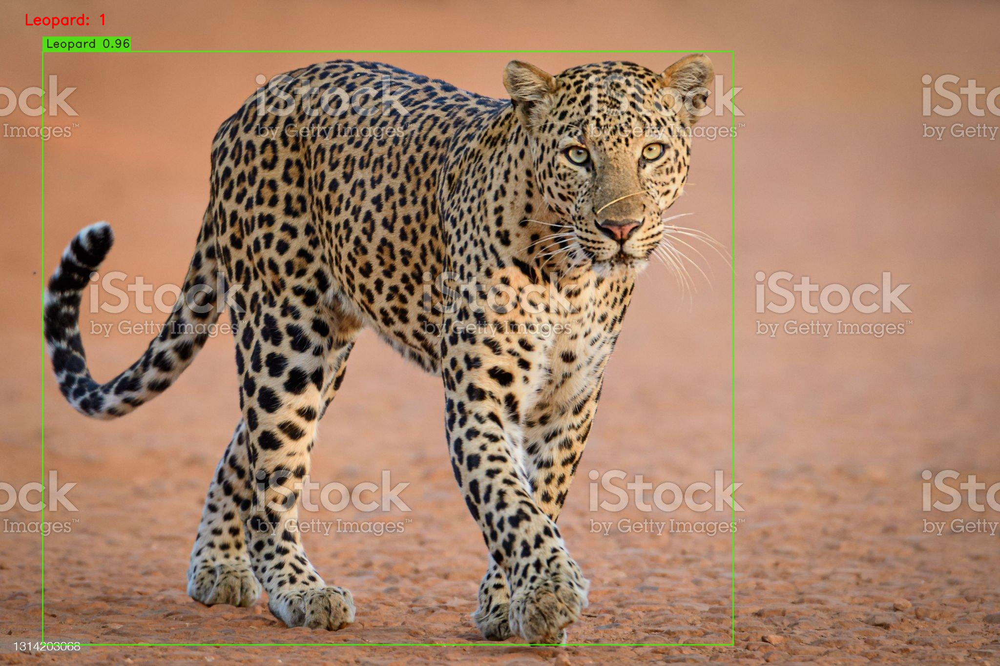

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
%matplotlib inline

from google.colab.patches import cv2_imshow



# Saving the predicted image and gathering the details required
from collections import Counter

# pred = best_model.predict('https://img.theweek.in/content/dam/week/news/india/images/2020/12/22/leopard-pti.jpg')
# pred = best_model.predict('https://cdn.britannica.com/40/146340-050-297B2798/Leopard-tree-Kenya-Masai-Mara-National-Reserve.jpg')
# pred = best_model.predict('https://i.pinimg.com/1200x/da/8f/72/da8f729a05ad064830f30cc757d2d277.jpg')
pred = best_model.predict('https://media.istockphoto.com/id/1314203068/photo/leopard.jpg?s=2048x2048&w=is&k=20&c=zHRm1lyeITCZBP02sFaGvqoF0D8w1ngBVYrs6R9oR_c=')

result = list(pred)[0]

class_names = list(result.class_names)

counter = Counter(list(result.prediction.labels.astype("int")))
output = list(counter.items())
output = list(map(lambda x: (class_names[x[0]],x[1]),output))

# saving the predicted image
pred.save(output_folder="/content/output")

print(output)


# To get the number of objects in each class diplayed in the image

# path
path = r'/content/output/pred_0.jpg'

# Reading an image in default mode
image = cv2.imread(path)

for i in range(len(output)):
  # Using cv2.putText() method
  org = (50, 50*i+50)
  image = cv2.putText(image, str(output[i][0]) + ': '+ str(output[i][1]), org, cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(0, 0, 255), thickness =2, lineType = cv2.LINE_AA)

# Displaying the image
cv2_imshow(image)

In [ ]:
best_model.predict('/content/pexels-anil-sharma-10503057 (1080p).mp4',  conf=0.50).save('leopard_detections.mp4')

Predicting Video: 100%|██████████| 609/609 [08:56<00:00,  1.13it/s]


In [ ]:
# best_model.predict('/content/pexels-anil-sharma-10503057 (1080p).mp4',  conf=0.50).show()

In [ ]:
shutil.copy('/content/leopard_chekpt.zip', '/content/drive/MyDrive')

'/content/drive/MyDrive/leopard_chekpt.zip'

In [ ]:
from collections import Counter
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import math
from matplotlib.pyplot import imshow
%matplotlib inline

from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture('/content/2leopards_sleeping.mp4')

frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
classnames = ['Leopard', 'Turkey', 'Horse', 'Jellyfish', 'Polar bear', 'Rhinoceros', 'Chicken', 'Tiger', 'Lion', 'Sea turtle', 'Kangaroo', 'Deer', 'Bear', 'Bull', 'Elephant', 'Scorpion',
'Brown bear', 'Snail', 'Butterfly', 'Turtle', 'Caterpillar', 'Goldfish', 'Sheep', 'Goose', 'Magpie', 'Mule', 'Worm', 'Squid', 'Otter', 'Crab', 'Jaguar', 'Frog', 'Penguin', 'Starfish',
'Hippopotamus', 'Koala', 'Monkey', 'Camel', 'Canary', 'Rabbit', 'Parrot', 'Swan', 'Shrimp', 'Whale', 'Duck', 'Moths and butterflies', 'Owl', 'Crocodile', 'Fox', 'Woodpecker', 'Hamster',
'Seahorse', 'Squirrel', 'Goat', 'Shark', 'Giraffe', 'Red panda', 'Hedgehog', 'Raccoon', 'Zebra', 'Eagle', 'Cheetah', 'Tick', 'Snake', 'Mouse', 'Tortoise', 'Ostrich', 'Raven', 'Sparrow',
'Harbor seal', 'Centipede', 'Pig', 'Fish', 'Panda', 'Lizard', 'Cattle', 'Sea lion', 'Ladybug', 'Spider', 'Lynx', 'Hyena']

out = cv2.VideoWriter('leopard_tracker2.mp4', cv2.VideoWriter_fourcc('M', 'J', 'P', 'G'), 10, (frame_width, frame_height))

while True:
  ret, frame = cap.read()
  # count +=1
  if ret:
    result = list(best_model.predict(frame))[0]
    bbox_xyxys = result.prediction.bboxes_xyxy.tolist()
    confidences = result.prediction.confidence
    labels = result.prediction.labels.tolist()
    # print(labels)

    for (bbox_xyxy, confidence, cls) in zip(bbox_xyxys, confidences, labels):
      bbox = np.array(bbox_xyxy)
      x1, y1, x2, y2 = bbox[0], bbox[1], bbox[2], bbox[3]
      x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
      classname = int(cls)
      class_name = classnames[classname]
      conf = math.ceil((confidence*100))/100

    # pred = best_model.predict('/content/2leopards_sleeping.mp4')
    # result = list(pred)[0]
    class_names = list(result.class_names)

    counter = Counter(list(result.prediction.labels.astype("int")))
    output = list(counter.items())
    output = list(map(lambda x: (class_names[x[0]],x[1]),output))

    for i in range(len(output)):
      # Using cv2.putText() method
      org = (frame_width-300, 50*i+100)
      cv2.putText(frame, str(output[i][0]) + ': '+ str(output[i][1]), org, cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(0, 0, 255), thickness =2, lineType = cv2.LINE_AA)

    cv2.rectangle(frame, (x1, y1), (x2, y2), (45, 210, 255), 2)
    label = f'{class_name}: {conf}'
    cv2.putText(frame, label, (x1+3, y1), 0, 0.8, (0, 255, 0), thickness = 2, lineType = cv2.LINE_AA)
    out.write(frame)
    # cv2_imshow(frame)

    if cv2.waitKey(1) & 0xFF == ord('1'):
      break
  else:
    break

out.release()
cap.release()
cv2.destroyAllWindows()